# EEL5934 Final Exam Part 2

In [1]:
# Import all necessary libraries and magics

from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, silhouette_score, rand_score

# Question 1 (12 points)

**In this problem, you will be working with the digits dataset that is readily available in ```sklearn.datasets```.**

**This dataset contains 1797 grayscale $8 \times 8$ pixel images of handwritten digits. Each image is flattened to a 1-D vector of size 64. There is a total of 10 labels (digits 0 through 9), and the usual task is to train a model that can predict which digit is represented in each picture. Let's import the data.**

In [2]:
from sklearn.datasets import load_digits

digits = load_digits()
# print(digits.DESCR)

# Feature matrix
X = digits.data

# Target labels
t = digits.target

X.shape, t.shape

((1797, 64), (1797,))

In [3]:
digits.keys()

dict_keys(['data', 'target', 'frame', 'feature_names', 'target_names', 'images', 'DESCR'])

**Answer the following questions:**

1. **(2 points) Stratify partition the data into training, test and validation sets.**

In [4]:
X_training, X_test, t_training, t_test = train_test_split(X,t,
                                                 test_size=0.2,
                                                 random_state=0,
                                                 shuffle=True,
                                                 stratify=t)

t_training

array([3, 9, 1, ..., 6, 5, 8])

In [5]:
X_train, X_val, t_train, t_val = train_test_split(X_training,t_training,
                                                 test_size=0.3,
                                                 random_state=0,
                                                 shuffle=True,
                                                 stratify=t_training)

2. **(7 points) Cluster the images using K-Means. Select the _right_ number of clusters (try 2 to 100 clusters) using one of the techniques discussed in class.**

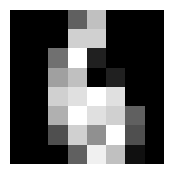

In [6]:
plt.figure(figsize=(2,2))
plt.imshow(X_train[0,:].reshape(8,8), cmap='gray')
plt.axis('off');

In [7]:
from sklearn.metrics import silhouette_score

best_k = None    #will store the best number k
best_score = -1   #stores the highest silhouette score, start with −1 because silhouette score ranges from −1 to +1, so any real score will be higher.

for i in range(2, 101):
    pipeline = Pipeline([('scaling', MinMaxScaler()),
        ('kmeans', KMeans(n_clusters=i,random_state=0))])
    
    labels = pipeline.fit_predict(X_train) 

    score = silhouette_score(X_train, labels)

    if score > best_score:
        best_score = score
        best_k = i

print("Best k by silhouette:", best_k)


Best k by silhouette: 13


In [8]:
# model

pipeline = Pipeline([('scaling', MinMaxScaler()),
        ('kmeans', KMeans(n_clusters=13,random_state=0))])
pipeline.fit(X_train, t_train)
y_train=pipeline.predict(X_train)
y_val=pipeline.predict(X_val)
print('Rand score training:', rand_score(t_train, y_train))
print('Rand score validation:', rand_score(t_val, y_val))

Rand score training: 0.9528929059879884
Rand score validation: 0.9564535533213028


3. **(3 points) Visualize the cluster centroids as $8\times 8$ images.**

In [9]:
centroids = pipeline.steps[1][1].cluster_centers_

centroids.shape

(13, 64)

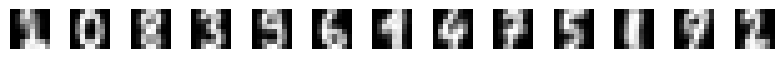

In [10]:

plt.figure(figsize=(10,3))
for i in range(centroids.shape[0]):
    plt.subplot(5,centroids.shape[0],i+1)
    plt.imshow(centroids[i,:].reshape(8,8), cmap='gray')
    plt.axis('off')

---

# Question 2 (10 points)

**In this problem, you will be working with the dataset displayed below. The goal is to find the best fitting curve (regression).**

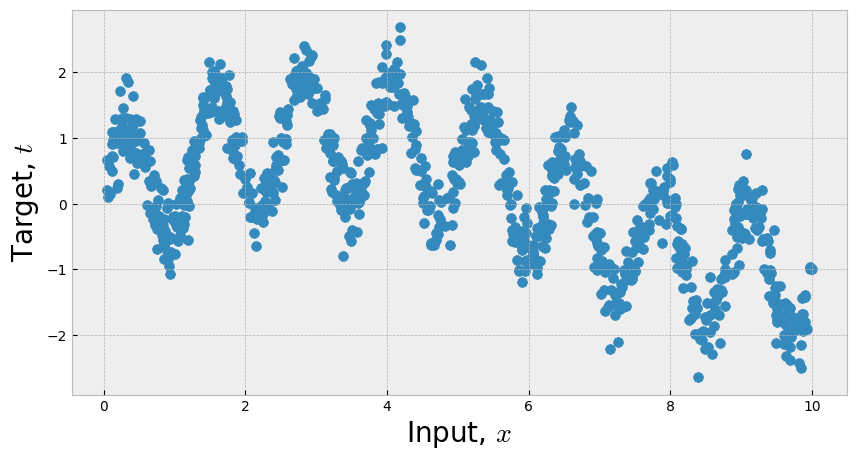

In [11]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')

N = 1000
rng = np.random.RandomState(42)
X = 10 * rng.rand(N)

def model(X, sigma=0.3):
    fast_oscillation = np.sin(5 * X)
    slow_oscillation = np.sin(0.5 * X)
    noise = sigma * rng.randn(len(X))

    return slow_oscillation + fast_oscillation + noise

plt.figure(figsize=(10,5))
t = model(X)
plt.scatter(X, t, s=50)
plt.xlabel('Input, $x$', size=20)
plt.ylabel('Target, $t$', size=20);

The input data is:

In [12]:
X = X.reshape(-1,1)
X.shape

(1000, 1)

The target values are:

In [13]:
t = t.reshape(-1,1)
t.shape

(1000, 1)

**Answer the following questions:**

1. **(4 points) Partition the dataset into training, test and validation sets. Train a uniform [KNN regressor](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html). Carry the experimental design with ```GridSearchCV``` to find the optimal number of clusters with the MSE as your scoring metric. Visualize predictions.**

In [14]:
X_training, X_test, t_training, t_test = train_test_split(X,t,
                                                 test_size=0.2,
                                                 random_state=0,
                                                 shuffle=True)


In [15]:
X_train, X_val, t_train, t_val = train_test_split(X_training,t_training,
                                                 test_size=0.3,
                                                 random_state=0,
                                                 shuffle=True)

In [16]:
from sklearn.model_selection import GridSearchCV


In [17]:
from sklearn.neighbors import KNeighborsRegressor
neigh = pipeline = Pipeline([
    ('knn',KNeighborsRegressor(weights = 'uniform' ))])
neigh

Pipeline(steps=[('knn', KNeighborsRegressor())])

In [18]:
# grid = GridSearchCV(estimator=pipeline,
#                     scoring = mean_squared_error,
#                     param_grid = X_train,
#                     cv = 3)

# grid

In [19]:
from sklearn.model_selection import GridSearchCV

param_grid = dict(knn__n_neighbors=range(N+1)) 

grid = GridSearchCV(pipeline, 
                        param_grid, 
                        cv=3,
                        scoring='neg_mean_squared_error') 

grid.fit(X_train, t_train) 



c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 982, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_scorer.py", line 345, in _score
    y_pred = method_caller(
             

GridSearchCV(cv=3, estimator=Pipeline(steps=[('knn', KNeighborsRegressor())]),
             param_grid={'knn__n_neighbors': range(0, 1001)},
             scoring='neg_mean_squared_error')

In [20]:
print(grid.best_params_)



{'knn__n_neighbors': 6}


In [21]:
final_model = grid.best_estimator_

y_train = final_model.predict(X_train[np.argsort(X_train, axis=0).flatten()])
y_val   = final_model.predict(X_val[np.argsort(X_val, axis=0).flatten()])
y_test  = final_model.predict(X_test[np.argsort(X_test, axis=0).flatten()])

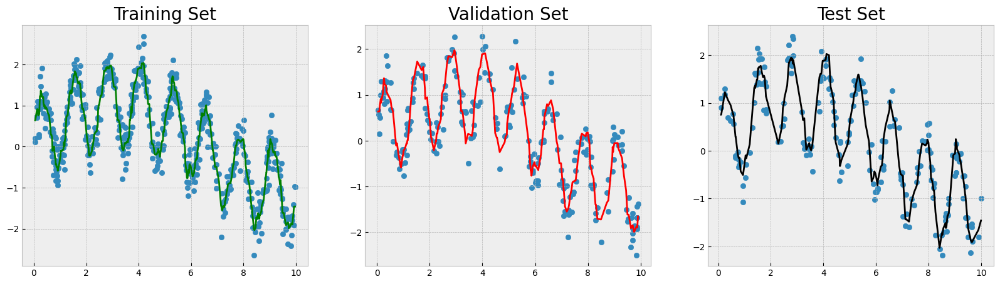

In [22]:
plt.figure(figsize=(20,5))

plt.subplot(1,3,1)
plt.scatter(X_train, t_train)
plt.plot(X_train[np.argsort(X_train, axis=0).flatten()], y_train, 'g')
plt.title('Training Set', size=20)

plt.subplot(1,3,2)
plt.scatter(X_val, t_val)
plt.plot(X_val[np.argsort(X_val, axis=0).flatten()], y_val, 'r')
plt.title('Validation Set', size=20)

plt.subplot(1,3,3)
plt.scatter(X_test, t_test)
plt.plot(X_test[np.argsort(X_test, axis=0).flatten()], y_test, 'k')
plt.title('Test Set', size=20);

2. **(4 points) Use the same train/test splits to Train a weighted [KNN regressor](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html). Carry the experimental design with ```GridSearchCV``` to find the optimal number of clusters with the MSE as your scoring metric. Visualize predictions.**

In [23]:
from sklearn.neighbors import KNeighborsRegressor
neigh = pipeline = Pipeline([
    ('knn',KNeighborsRegressor(weights = 'distance' ))])



param_grid = dict(knn__n_neighbors=range(N+1)) 

grid = GridSearchCV(pipeline, 
                        param_grid, 
                        cv=3,
                        scoring='neg_mean_squared_error') 

grid.fit(X_train, t_train) 
print(grid.best_params_)



c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 982, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_scorer.py", line 345, in _score
    y_pred = method_caller(
             

{'knn__n_neighbors': 14}


In [24]:
final_model = grid.best_estimator_

y_train = final_model.predict(X_train[np.argsort(X_train, axis=0).flatten()])
y_val   = final_model.predict(X_val[np.argsort(X_val, axis=0).flatten()])
y_test  = final_model.predict(X_test[np.argsort(X_test, axis=0).flatten()])

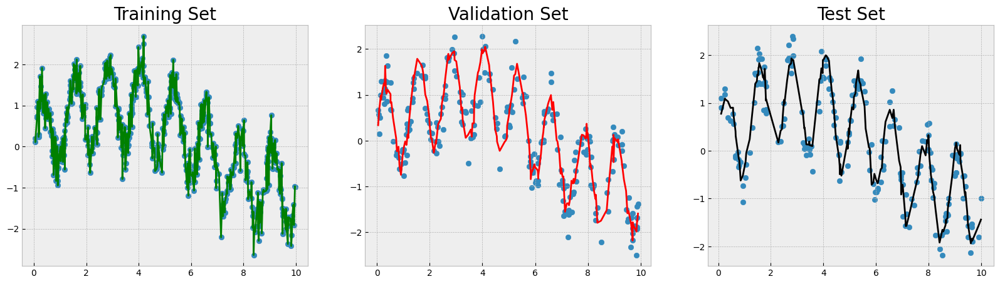

In [25]:
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.scatter(X_train, t_train)
plt.plot(X_train[np.argsort(X_train, axis=0).flatten()], y_train, 'g')
plt.title('Training Set', size=20)

plt.subplot(1,3,2)
plt.scatter(X_val, t_val)
plt.plot(X_val[np.argsort(X_val, axis=0).flatten()], y_val, 'r')
plt.title('Validation Set', size=20)

plt.subplot(1,3,3)
plt.scatter(X_test, t_test)
plt.plot(X_test[np.argsort(X_test, axis=0).flatten()], y_test, 'k')
plt.title('Test Set', size=20);

3. **(2 points) Discuss observations about smoothness of curve between uniform and weighted  KNN.**

uniform - amoother
weighted - overfitting 

---

# Question 3 (15 points)

**In this problem you will be working with the Breast Cancer Dataset available in ```scikit-learn```.**

**This dataset contains 569 samples each described by 30 attributes. Each 30-dimensional sample is labeled as benign (label 1) or malignant (label 0). Let's import the data.**

In [26]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()

# Obtaining feature matrix and target labels
X = cancer.data
t = cancer.target

X.shape, t.shape

((569, 30), (569,))

In [30]:
cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [27]:
np.unique(t, return_counts=True)

# Class 0 is malignant - total of 212 samples
# Class 1 is benign    - total of 357 samples

(array([0, 1]), array([212, 357], dtype=int64))

In [28]:
# More info about the dataset:

print(cancer.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 569

:Number of Attributes: 30 numeric, predictive attributes and the class

:Attribute Information:
    - radius (mean of distances from center to points on the perimeter)
    - texture (standard deviation of gray-scale values)
    - perimeter
    - area
    - smoothness (local variation in radius lengths)
    - compactness (perimeter^2 / area - 1.0)
    - concavity (severity of concave portions of the contour)
    - concave points (number of concave portions of the contour)
    - symmetry
    - fractal dimension ("coastline approximation" - 1)

    The mean, standard error, and "worst" or largest (mean of the three
    worst/largest values) of these features were computed for each image,
    resulting in 30 features.  For instance, field 0 is Mean Radius, field
    10 is Radius SE, field 20 is Worst Radius.

    - 

**Answer the following questions:**

1. **(5 points) Train a pipeline with the soft-margin SVM with an RBF kernel. Carry the experimental design for determining the best value for the parameter $C$ (consider at least the values ```[1, 10, 100, 1000]```). Report the classification report in training and test sets.**

**Note: be sure to include any necessary preliminary steps appropriate for this dataset.**

In [31]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

2. **(5 points) Using the same train/test splits from part 1, perform dimensionality reduction with PCA. How many components are needed to explain at least 90% of the variance? Include a plot to help answer this question.**

3. **(5 points) Train a pipeline with the PCA for dimensionality reduction followed by soft-margin SVM with an RBF kernel classifier. Include any preprocessing steps as needed. Carry the experimental design for determining the best value for the parameters: $C$ in SVM (consider at least the values ```[1, 10, 100, 1000]```) and ```n_components``` in PCA (consider all integers from 1 to 30). Report the classification report in training and test sets.**

**Compare results with part 1. Which model would you pick? Why?**

---

# Question 4 (13 points)

**In this problem you will again be working with the Breast Cancer Dataset available in ```scikit-learn```.**

**This dataset contains 569 samples each described by 30 attributes. Each 30-dimensional sample is labeled as benign (label 1) or malignant (label 0). Let's import the data.**

In [29]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()

# Obtaining feature matrix and target labels
X = cancer.data
t = cancer.target

X.shape, t.shape

((569, 30), (569,))

1. (7 points) **Train an MLP with the Sequential API with 2 hidden layers: 1st hidden layer with 100 units and the relu activation function, 2nd hidden layer with 50 units with the relu activation function. Compile the model with the Adam optimization with $\eta=0.01$, track the metric accuracy, and add an early stopping callback on ```val_loss``` with 10 epochs patience.**

**Encode the input and output layers to solve this binary classification task. Choose appropriate activation function for the output layer and objective function.**

**Report the classification report in training and test sets. Discuss results.**

In [34]:
from tensorflow import keras


In [38]:
from sklearn.metrics import accuracy_score
from sklearn.neural_network import MLPClassifier

from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping

In [50]:
model = keras.models.Sequential([
    keras.Input(shape=(30,)),
    keras.layers.Flatten(),
    keras.layers.Dense(100, activation='relu'),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

In [56]:
optimizer = keras.optimizers.Adam(learning_rate=0.01)

In [58]:
model.compile(loss='binary_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

In [61]:
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)


In [62]:
history = model.fit(X,t,epochs=10, batch_size=32,validation_split=0.1,
    callbacks=[early_stop])

Epoch 1/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.9199 - loss: 0.2298 - val_accuracy: 0.9474 - val_loss: 0.1963
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9121 - loss: 0.2401 - val_accuracy: 0.9474 - val_loss: 0.1859
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9141 - loss: 0.2571 - val_accuracy: 0.9123 - val_loss: 0.1886
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9199 - loss: 0.2112 - val_accuracy: 0.9123 - val_loss: 0.2028
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9121 - loss: 0.2543 - val_accuracy: 0.9123 - val_loss: 0.1826
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9062 - loss: 0.2548 - val_accuracy: 0.8596 - val_loss: 0.3401
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8984 - loss: 0.2972 - val_accuracy: 0.9649 - val_loss: 0.1743
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8828 - loss: 0.3084 - val_accuracy: 0.9649 - val_los

In [66]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [69]:
print("Final Training Accuracy:", history.history['accuracy'][-1])
# print("Final Training AUC:", history.history['auc'][-1])
print("Final Validation Loss:", history.history['val_loss'][-1])
print("Final Validation Accuracy:", history.history['val_accuracy'][-1])
# print("Final Validation AUC:", history.history['val_auc'][-1])



Final Training Accuracy: 0.908203125
Final Validation Loss: 0.19323153793811798
Final Validation Accuracy: 0.9122806787490845


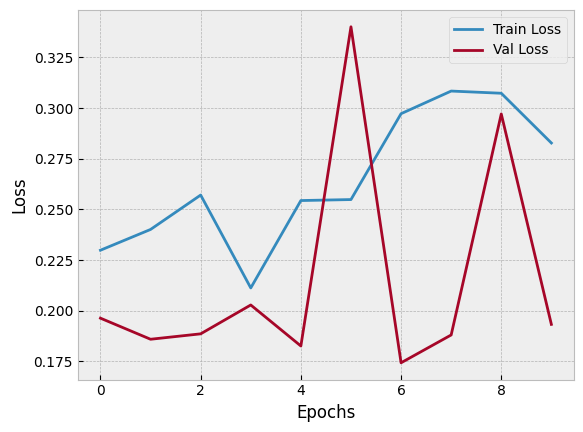

In [70]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label="Train Loss")
plt.plot(history.history['val_loss'], label="Val Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()


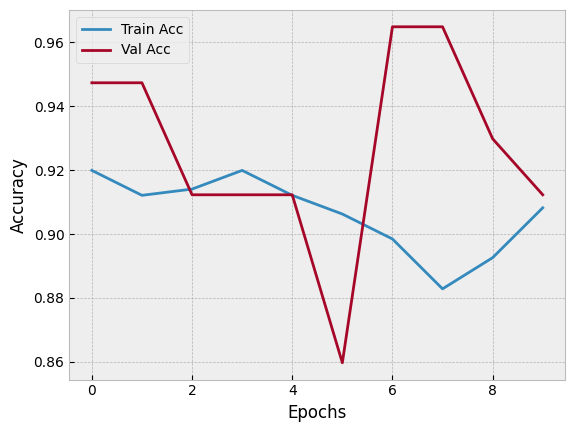

In [71]:
plt.plot(history.history['accuracy'], label="Train Acc")
plt.plot(history.history['val_accuracy'], label="Val Acc")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


(8 points) **Train a CNN with the Sequential API with the following architecture:**

* **convolutional layer with with 16 $3\times 3$ filters, zeros-padding and the relu activation function**
* **max-pooling layer with a pool size of 2 and a stride of 2**
* **convolutional layer with 32 $7\times 7$ filters, zeros-padding and the relu activation function**
* **max-pooling layer with a pool size of 2 and a stride of 2**
* **dense hidden layer with 20 units, relu activation function**
* **output layer**

**Encode the input and output layers to solve this binary classification task. Choose appropriate activation function for the output layer and objective function.**

**Compile the model with the Adam optimization with $\eta=0.01$, track the metric accuracy, and add an early stopping callback on ```val_loss``` with 10 epochs patience.**

**Report the classification report in training and test sets. Discuss results.**

In [74]:
input_shape = 28,28,1
model = keras.models.Sequential([layers.
                                 Conv2D(filters=16, kernel_size=(3, 3),
        padding='same',
        activation='relu',
        input_shape=input_shape)])

c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [75]:
layers.MaxPooling2D(pool_size=2, strides=2)

<MaxPooling2D name=max_pooling2d, built=True>

In [76]:
layers.Conv2D(
        filters=32,
        kernel_size=(7, 7),
        padding='same',
        activation='relu'
    ),

(<Conv2D name=conv2d_1, built=False>,)

In [77]:
layers.MaxPooling2D(pool_size=2, strides=2),

(<MaxPooling2D name=max_pooling2d_1, built=True>,)

In [79]:
layers.Flatten(),layers.Dense(20, activation='relu'),


(<Flatten name=flatten_5, built=False>, <Dense name=dense_15, built=False>)

In [81]:
layers.Dense(10, activation='softmax') 

<Dense name=dense_16, built=False>

In [82]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.01),
    loss='sparse_categorical_crossentropy',   # or 'binary_crossentropy' for binary
    metrics=['accuracy']
)

In [85]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 28, 28, 16)     │           160 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 160 (640.00 B)

 Trainable params: 160 (640.00 B)

 Non-trainable params: 0 (0.00 B)

In [84]:
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_split=0.1
)

Epoch 1/20


ValueError: Exception encountered when calling Sequential.call().

[1mInvalid input shape for input Tensor("data:0", shape=(None, 1), dtype=float32). Expected shape (None, 28, 28, 1), but input has incompatible shape (None, 1)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(None, 1), dtype=float32)
  • training=True
  • mask=None
  • kwargs=<class 'inspect._empty'>

---